
<br>
<font>
<div dir=ltr align=center>
<img src="https://cdn.freebiesupply.com/logos/large/2x/sharif-logo-png-transparent.png" width=150 height=150>
<div dir=ltr align=center>
<font color=0F5298 size=7>
    Artificial Intelligence <br>
<font color=2565AE size=5>
    Computer Engineering Department <br>
    Spring 2025<br>
<font color=3C99D size=5>
    Project-Phase1<br>
    Image Segmentation<br>
<font color=696880 size=4>
    Shayan Baghayi Nejad-Armin Khosravi


<font size=5 color=cyan> Names: Nazanin Yousefi, Mahan Gharegozlou, MohammadMahdi NouriBorji

Student Numbers: 401110172, 401170134, 401170061 </font>

# Introduction

In this Project, we will become familiar with UNet architecture, Attention mechanism, and Residual blocks with the help of which we will build UNet, AttentionUNet, and ResidualAttentionUnet from scratch using PyTorch framework. The built models will be evaluated by various metrics such as accuracy, Iou score, and Dice score.

### Environment Setup

Here you will find the required packages. Feel free to add the list.

In [ ]:
import os
import shutil
import numpy as np
from PIL import Image
import torch
import torch.nn as nn
import kagglehub
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torch.optim import Adam
from tqdm import tqdm

import cv2

device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

### Hyperparameter Setting

Place your hyperparameters' values in the cell below.

In [ ]:
!cp -r /content/drive/MyDrive/massachusetts-roads-dataset /content/dataset/

In [ ]:
DATA_DIR = "/content/dataset/massachusetts-roads-dataset"
IMAGE_SIZE = (256, 256)
BATCH_SIZE = 8
NUM_WORKERS = 2 # for multiprocessing

# Data Preparation

Our task is to segment the [Massachusetts Road Dataset](https://www.kaggle.com/datasets/balraj98/massachusetts-roads-dataset). You can download this dataset by placing your API Token from kaggle in ```~/.kaggle/``` folder (Instructions can be found in the Kaggle website) and then running the code below.

If you are running on colab, it is highly recommended to save the dataset to your drive to avoid problems when disconnecting from runtime.

In [ ]:
from google.colab import drive

drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


### Loading Images

Load the images and their corresponding masks in two separate lists. (The cell below might take some time to execute.)

In [ ]:
import pandas as pd
import os
import cv2
from tqdm import tqdm # Import tqdm

def load_images_and_masks_from_metadata(metadata_path, data_dir, image_size):
    """
    Loads and preprocesses images and their corresponding masks based on metadata.
    Includes progress display using tqdm.

    Args:
        metadata_path (str): Path to the metadata CSV file.
        data_dir (str): Base directory where image and mask files are located.
        image_size (tuple): Desired size (width, height) to resize images and masks.

    Returns:
        images (list): Loaded and resized images.
        masks (list): Loaded and resized masks.
    """
    metadata_df = pd.read_csv(metadata_path)

    # counter = 0

    data_dict = {
        "train": {
            "image": [],
            "mask": [],
        },
        "val": {
            "image": [],
            "mask": [],
        },
        "test": {
            "image": [],
            "mask": [],
        },
    }

    # Use tqdm for progress bar
    for index, row in tqdm(metadata_df.iterrows(), total=len(metadata_df), desc="Loading images and masks"):
        current_split = row["split"]

        img_relative_path = row['tiff_image_path']
        mask_relative_path = row['tif_label_path']

        img_path = os.path.join(data_dir, img_relative_path)
        mask_path = os.path.join(data_dir, mask_relative_path)

        image = cv2.imread(img_path, cv2.IMREAD_COLOR)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        if image is None:
            print(f"Warning: Failed to load image {img_path}")
            continue
        if mask is None:
            print(f"Warning: Failed to load mask {mask_path}")
            continue

        # Ensure consistent resizing
        image = cv2.resize(image, image_size)
        mask = cv2.resize(mask, image_size)

        data_dict[current_split]["image"].append(image)
        data_dict[current_split]["mask"].append(mask)

        # counter += 1

        # if counter == 100:
        #   break

    return data_dict

# Define the path to the metadata file
metadata_file = os.path.join(DATA_DIR, 'metadata.csv')

dataset = load_images_and_masks_from_metadata(metadata_file, DATA_DIR, IMAGE_SIZE)

Loading images and masks:   0%|          | 1/1171 [00:14<4:50:54, 14.92s/it]

Loading images and masks:   1%|▏         | 16/1171 [00:58<50:17,  2.61s/it]  

Loading images and masks:   3%|▎         | 31/1171 [01:52<1:13:52,  3.89s/it]

Loading images and masks:   4%|▍         | 44/1171 [02:33<59:10,  3.15s/it]

Loading images and masks:   4%|▍         | 49/1171 [02:47<49:52,  2.67s/it]

Loading images and masks:   4%|▍         | 50/1171 [02:49<43:03,  2.30s/it]

Loading images and masks:   4%|▍         | 51/1171 [02:50<37:42,  2.02s/it]

Loading images and masks:   5%|▌         | 59/1171 [03:12<45:52,  2.47s/it]

Loading images and masks:   5%|▌         | 60/1171 [03:14<40:51,  2.21s/it]

Loading images and masks:   6%|▌         | 67/1171 [03:35<47:48,  2.60s/it]

Loading images and masks:   7%|▋         | 83/1171 [04:22<47:10,  2.60s/it]

Loading images and masks:   8%|▊         | 89/1171 [04:40<49:17,  2.73s/it]

Loading images and masks:   8%|▊         | 90/1171 [04:42<41:43,  2.32s/it]

Loading images and masks:   8%|▊         | 94/1171 [04:52<41:11,  2.29s/it]

Loading images and masks:   8%|▊         | 99/1171 [05:06<45:51,  2.57s/it]

Loading images and masks:   9%|▊         | 101/1171 [05:11<44:32,  2.50s/it]

Loading images and masks:   9%|▉         | 111/1171 [05:43<1:00:40,  3.43s/it]

Loading images and masks:  12%|█▏        | 135/1171 [07:01<46:57,  2.72s/it]

Loading images and masks:  12%|█▏        | 142/1171 [07:23<49:20,  2.88s/it]

Loading images and masks:  14%|█▍        | 167/1171 [08:42<45:36,  2.73s/it]

Loading images and masks:  14%|█▍        | 168/1171 [08:44<38:05,  2.28s/it]

Loading images and masks:  15%|█▍        | 170/1171 [08:48<36:25,  2.18s/it]

Loading images and masks:  16%|█▌        | 187/1171 [09:37<40:39,  2.48s/it]

Loading images and masks:  16%|█▋        | 191/1171 [09:48<39:22,  2.41s/it]

Loading images and masks:  20%|█▉        | 234/1171 [12:03<39:50,  2.55s/it]

Loading images and masks:  20%|██        | 237/1171 [12:11<38:01,  2.44s/it]

Loading images and masks:  21%|██        | 245/1171 [12:34<39:51,  2.58s/it]

Loading images and masks:  22%|██▏       | 260/1171 [13:19<45:26,  2.99s/it]

Loading images and masks:  22%|██▏       | 262/1171 [13:26<46:47,  3.09s/it]

Loading images and masks:  23%|██▎       | 270/1171 [13:50<40:42,  2.71s/it]

Loading images and masks:  23%|██▎       | 272/1171 [13:54<35:56,  2.40s/it]

Loading images and masks:  24%|██▍       | 280/1171 [14:18<40:39,  2.74s/it]

Loading images and masks:  24%|██▍       | 281/1171 [14:19<35:51,  2.42s/it]

Loading images and masks:  24%|██▍       | 286/1171 [14:35<39:39,  2.69s/it]

Loading images and masks:  25%|██▍       | 289/1171 [14:42<34:45,  2.36s/it]

Loading images and masks:  25%|██▌       | 296/1171 [15:02<37:43,  2.59s/it]

Loading images and masks:  26%|██▌       | 304/1171 [15:25<36:38,  2.54s/it]

Loading images and masks:  27%|██▋       | 316/1171 [16:03<39:58,  2.81s/it]

Loading images and masks:  28%|██▊       | 328/1171 [16:42<38:47,  2.76s/it]

Loading images and masks:  29%|██▉       | 338/1171 [17:11<37:17,  2.69s/it]

Loading images and masks:  29%|██▉       | 344/1171 [17:29<37:42,  2.74s/it]

Loading images and masks:  31%|███       | 361/1171 [18:19<35:22,  2.62s/it]

Loading images and masks:  31%|███       | 363/1171 [18:24<31:46,  2.36s/it]

Loading images and masks:  31%|███       | 364/1171 [18:26<28:24,  2.11s/it]

Loading images and masks:  32%|███▏      | 369/1171 [18:40<33:30,  2.51s/it]

Loading images and masks:  32%|███▏      | 370/1171 [18:42<32:29,  2.43s/it]

Loading images and masks:  32%|███▏      | 372/1171 [18:46<29:06,  2.19s/it]

Loading images and masks:  33%|███▎      | 386/1171 [19:31<35:27,  2.71s/it]

Loading images and masks:  34%|███▍      | 401/1171 [20:14<32:01,  2.50s/it]

Loading images and masks:  35%|███▍      | 405/1171 [20:25<32:49,  2.57s/it]

Loading images and masks:  36%|███▌      | 418/1171 [21:02<30:39,  2.44s/it]

Loading images and masks:  36%|███▋      | 425/1171 [21:22<30:10,  2.43s/it]

Loading images and masks:  38%|███▊      | 441/1171 [22:09<32:38,  2.68s/it]

Loading images and masks:  39%|███▉      | 454/1171 [22:46<31:16,  2.62s/it]

Loading images and masks:  39%|███▉      | 462/1171 [23:11<31:47,  2.69s/it]

Loading images and masks:  40%|████      | 469/1171 [23:31<30:39,  2.62s/it]

Loading images and masks:  40%|████      | 474/1171 [23:46<30:02,  2.59s/it]

Loading images and masks:  42%|████▏     | 487/1171 [24:23<29:04,  2.55s/it]

Loading images and masks:  42%|████▏     | 490/1171 [24:30<27:01,  2.38s/it]

Loading images and masks:  42%|████▏     | 494/1171 [24:40<25:39,  2.27s/it]

Loading images and masks:  43%|████▎     | 498/1171 [24:51<28:34,  2.55s/it]

Loading images and masks:  43%|████▎     | 504/1171 [25:08<28:39,  2.58s/it]

Loading images and masks:  45%|████▍     | 523/1171 [26:02<25:19,  2.34s/it]

Loading images and masks:  45%|████▌     | 528/1171 [26:15<25:38,  2.39s/it]

Loading images and masks:  45%|████▌     | 531/1171 [26:25<30:01,  2.82s/it]

Loading images and masks:  46%|████▌     | 533/1171 [26:30<28:11,  2.65s/it]

Loading images and masks:  46%|████▋     | 544/1171 [27:01<25:29,  2.44s/it]

Loading images and masks:  47%|████▋     | 545/1171 [27:03<26:10,  2.51s/it]

Loading images and masks:  47%|████▋     | 546/1171 [27:05<23:27,  2.25s/it]

Loading images and masks:  49%|████▊     | 570/1171 [28:17<25:28,  2.54s/it]

Loading images and masks:  49%|████▉     | 571/1171 [28:19<23:08,  2.31s/it]

Loading images and masks:  49%|████▉     | 573/1171 [28:23<21:03,  2.11s/it]

Loading images and masks:  50%|█████     | 586/1171 [28:59<25:22,  2.60s/it]

Loading images and masks:  50%|█████     | 587/1171 [29:01<21:30,  2.21s/it]

Loading images and masks:  50%|█████     | 590/1171 [29:07<20:24,  2.11s/it]

Loading images and masks:  54%|█████▎    | 627/1171 [30:52<21:18,  2.35s/it]

Loading images and masks:  54%|█████▎    | 628/1171 [30:53<18:22,  2.03s/it]

Loading images and masks:  54%|█████▍    | 630/1171 [30:57<18:30,  2.05s/it]

Loading images and masks:  55%|█████▍    | 639/1171 [31:23<21:45,  2.45s/it]

Loading images and masks:  55%|█████▍    | 644/1171 [31:35<20:12,  2.30s/it]

Loading images and masks:  55%|█████▌    | 647/1171 [31:42<19:12,  2.20s/it]

Loading images and masks:  56%|█████▌    | 652/1171 [31:54<19:26,  2.25s/it]

Loading images and masks:  56%|█████▌    | 657/1171 [32:09<22:11,  2.59s/it]

Loading images and masks:  57%|█████▋    | 665/1171 [32:32<21:20,  2.53s/it]

Loading images and masks:  59%|█████▊    | 686/1171 [33:32<19:42,  2.44s/it]

Loading images and masks:  59%|█████▉    | 694/1171 [33:58<23:58,  3.02s/it]

Loading images and masks:  60%|█████▉    | 700/1171 [34:13<21:24,  2.73s/it]

Loading images and masks:  60%|█████▉    | 701/1171 [34:15<18:10,  2.32s/it]

Loading images and masks:  60%|██████    | 707/1171 [34:33<19:03,  2.47s/it]

Loading images and masks:  61%|██████    | 710/1171 [34:40<18:09,  2.36s/it]

Loading images and masks:  63%|██████▎   | 732/1171 [35:44<18:09,  2.48s/it]

Loading images and masks:  63%|██████▎   | 733/1171 [35:45<16:05,  2.21s/it]

Loading images and masks:  63%|██████▎   | 734/1171 [35:47<14:16,  1.96s/it]

Loading images and masks:  63%|██████▎   | 735/1171 [35:48<13:03,  1.80s/it]

Loading images and masks:  63%|██████▎   | 737/1171 [35:53<14:05,  1.95s/it]

Loading images and masks:  63%|██████▎   | 740/1171 [35:59<14:47,  2.06s/it]

Loading images and masks:  64%|██████▍   | 752/1171 [36:33<16:54,  2.42s/it]

Loading images and masks:  65%|██████▌   | 766/1171 [37:14<16:44,  2.48s/it]

Loading images and masks:  68%|██████▊   | 798/1171 [38:48<15:52,  2.55s/it]

Loading images and masks:  69%|██████▉   | 811/1171 [39:26<14:05,  2.35s/it]

Loading images and masks:  70%|██████▉   | 818/1171 [39:44<13:09,  2.24s/it]

Loading images and masks:  71%|███████   | 827/1171 [40:09<14:54,  2.60s/it]

Loading images and masks:  71%|███████   | 829/1171 [40:14<13:18,  2.33s/it]

Loading images and masks:  71%|███████   | 831/1171 [40:18<12:26,  2.19s/it]

Loading images and masks:  73%|███████▎  | 849/1171 [41:06<12:36,  2.35s/it]

Loading images and masks:  73%|███████▎  | 852/1171 [41:14<11:55,  2.24s/it]

Loading images and masks:  75%|███████▍  | 873/1171 [42:14<12:40,  2.55s/it]

Loading images and masks:  75%|███████▍  | 878/1171 [42:27<11:33,  2.37s/it]

Loading images and masks:  75%|███████▌  | 881/1171 [42:35<11:13,  2.32s/it]

Loading images and masks:  75%|███████▌  | 882/1171 [42:36<09:59,  2.08s/it]

Loading images and masks:  77%|███████▋  | 902/1171 [43:35<11:37,  2.59s/it]

Loading images and masks:  78%|███████▊  | 909/1171 [43:52<09:51,  2.26s/it]

Loading images and masks:  79%|███████▉  | 924/1171 [44:35<09:45,  2.37s/it]

Loading images and masks:  79%|███████▉  | 925/1171 [44:36<08:16,  2.02s/it]

Loading images and masks:  79%|███████▉  | 926/1171 [44:37<07:18,  1.79s/it]

Loading images and masks:  79%|███████▉  | 929/1171 [44:45<08:22,  2.07s/it]

Loading images and masks:  80%|███████▉  | 934/1171 [44:58<09:24,  2.38s/it]

Loading images and masks:  80%|███████▉  | 936/1171 [45:02<08:40,  2.22s/it]

Loading images and masks:  80%|████████  | 939/1171 [45:10<08:47,  2.27s/it]

Loading images and masks:  81%|████████  | 944/1171 [45:23<08:29,  2.24s/it]

Loading images and masks:  81%|████████▏ | 953/1171 [45:47<08:43,  2.40s/it]

Loading images and masks:  82%|████████▏ | 956/1171 [45:54<08:07,  2.27s/it]

Loading images and masks:  82%|████████▏ | 965/1171 [46:19<08:42,  2.54s/it]

Loading images and masks:  83%|████████▎ | 967/1171 [46:23<08:00,  2.36s/it]

Loading images and masks:  84%|████████▍ | 982/1171 [47:07<07:57,  2.53s/it]

Loading images and masks:  84%|████████▍ | 984/1171 [47:12<06:57,  2.23s/it]

Loading images and masks:  84%|████████▍ | 986/1171 [47:16<06:29,  2.10s/it]

Loading images and masks:  85%|████████▍ | 993/1171 [47:35<06:58,  2.35s/it]

Loading images and masks:  85%|████████▌ | 996/1171 [47:41<06:19,  2.17s/it]

Loading images and masks:  86%|████████▌ | 1009/1171 [48:19<06:41,  2.48s/it]

Loading images and masks:  87%|████████▋ | 1013/1171 [48:29<06:01,  2.29s/it]

Loading images and masks:  87%|████████▋ | 1020/1171 [48:48<05:49,  2.32s/it]

Loading images and masks:  87%|████████▋ | 1023/1171 [48:54<04:57,  2.01s/it]

Loading images and masks:  87%|████████▋ | 1024/1171 [48:55<04:25,  1.80s/it]

Loading images and masks:  88%|████████▊ | 1029/1171 [49:07<05:06,  2.16s/it]

Loading images and masks:  88%|████████▊ | 1030/1171 [49:08<04:25,  1.88s/it]

Loading images and masks:  89%|████████▊ | 1038/1171 [49:30<05:33,  2.50s/it]

Loading images and masks:  89%|████████▉ | 1045/1171 [49:48<04:51,  2.31s/it]

Loading images and masks:  89%|████████▉ | 1048/1171 [49:56<04:41,  2.29s/it]

Loading images and masks:  90%|████████▉ | 1052/1171 [50:07<05:19,  2.68s/it]

Loading images and masks:  90%|█████████ | 1057/1171 [50:21<04:43,  2.48s/it]

Loading images and masks:  91%|█████████ | 1064/1171 [50:39<04:10,  2.34s/it]

Loading images and masks:  91%|█████████ | 1066/1171 [50:43<03:50,  2.19s/it]

Loading images and masks:  92%|█████████▏| 1072/1171 [50:59<03:54,  2.37s/it]

Loading images and masks:  93%|█████████▎| 1094/1171 [52:03<03:01,  2.35s/it]

Loading images and masks:  94%|█████████▍| 1099/1171 [52:17<02:50,  2.37s/it]

Loading images and masks:  94%|█████████▍| 1103/1171 [52:29<02:57,  2.60s/it]

Loading images and masks: 100%|██████████| 1171/1171 [56:06<00:00,  2.87s/it]


In [ ]:
train_images = dataset["train"]["image"]
train_masks  = dataset["train"]["mask"]

val_images = dataset["val"]["image"]
val_masks  = dataset["val"]["mask"]

test_images = dataset["test"]["image"]
test_masks  = dataset["test"]["mask"]

### Data Visualization

Display the images and their masks for several samples.

In [ ]:
def visualize_images_and_masks(images, masks, n=5):
    """
    Visualizes 'n' images and their corresponding masks side by side.

    Args:
        images (array-like): Collection of input images.
        masks (array-like): Collection of corresponding mask images.
        n (int): Number of image-mask pairs to display.
    """
    plt.figure(figsize=(10, 4 * n))

    for i in range(n):
        # Show image
        plt.subplot(n, 2, 2 * i + 1)
        plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))  # convert BGR to RGB
        plt.title(f"Image {i+1}")
        plt.axis('off')

        # Show corresponding mask
        plt.subplot(n, 2, 2 * i + 2)
        plt.imshow(masks[i], cmap='gray')
        plt.title(f"Mask {i+1}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

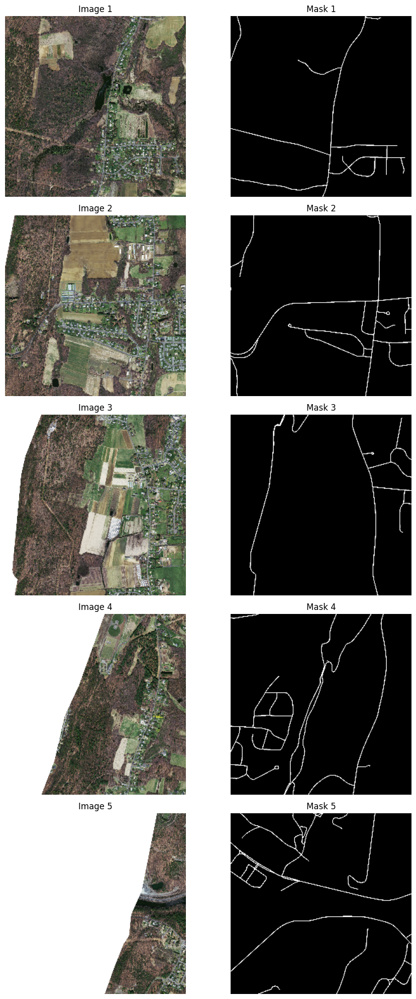


Validation Samples:


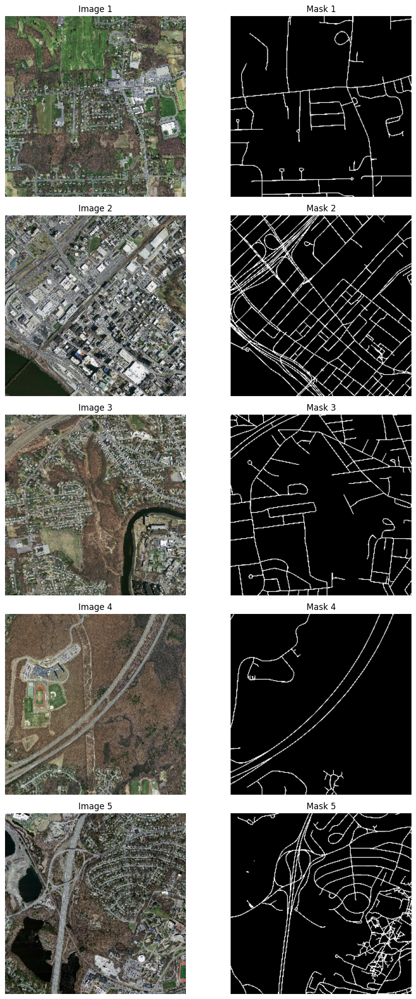

In [ ]:
# After the visualization function definition, add:
# Visualize a few samples from training data
visualize_images_and_masks(train_images[:5], train_masks[:5],5)

# Optionally, also visualize some validation samples
print("\nValidation Samples:")
visualize_images_and_masks(val_images[:5], val_masks[:5],5)

In [ ]:
len(train_images)

961

### Dataset Creation

Finally, we will make the dataset using the list of images we have stored.

In [ ]:
class RoadDataset(Dataset):
    """
    Custom Dataset class for loading road images and their corresponding masks.

    Args:
        images (array-like): List or array of input images.
        masks (array-like): List or array of corresponding masks.
        image_transform (callable, optional): Transformation to apply to the images.
        mask_transform (callable, optional): Transformation to apply to the masks.
    """
    def __init__(self, images, masks, image_transform=None, mask_transform=None):
        self.images = images
        self.masks = masks
        self.image_transform = image_transform
        self.mask_transform = mask_transform

    def __len__(self):
        # pass
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        mask = self.masks[idx]

        # Convert from NumPy to PIL for transforms (if needed)
        image = Image.fromarray(image.astype('uint8'))
        mask = Image.fromarray(mask.astype('uint8'))

        if self.image_transform:
            image = self.image_transform(image)
        if self.mask_transform:
            mask = self.mask_transform(mask)

        return image, mask


### Define your desired transformations
image_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # 3-channel RGB
])

mask_transform = transforms.Compose([
    transforms.ToTensor()  # for grayscale masks
])




train_dataset = RoadDataset(train_images, train_masks, image_transform, mask_transform)
val_dataset   = RoadDataset(val_images, val_masks, image_transform, mask_transform)

train_loader  = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS)
val_loader    = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False,num_workers=NUM_WORKERS)

# UNet

Before proceeding, it is necessary to understand the idea behind UNet. In order to avoid too much details in this notebook, you can read the complete paper for UNet from [this link](https://arxiv.org/pdf/1505.04597).

The overall structure of UNet is provided in the image below.

![UNet Architecture](https://viso.ai/wp-content/uploads/2024/04/unet-process.png)

### Convolution Block

Convolution block is used at each level of UNet.

In [ ]:
class ConvBlock(nn.Module):
    """
    A convolutional block consisting of multiple layers (e.g., Conv2D, BatchNorm, ReLU).

    Args:
        in_channel (int): Number of input channels.
        out_channel (int): Number of output channels.
    """
    def __init__(self, in_channel, out_channel, kernel_size=3, stride=1, padding=1):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channel, out_channel, kernel_size=kernel_size, stride=stride, padding=padding, bias=False),
            nn.BatchNorm2d(out_channel),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
      return self.conv(x)

### Up Convoluitional Block

We use another block to upsample the latent vector.

In [ ]:
class UpConvBlock(nn.Module):
    """
    An upsampling block used in decoder parts of segmentation networks like U-Net.

    Args:
        in_channel (int): Number of input channels.
        out_channel (int): Number of output channels.
    """
    def __init__(self, in_channel, out_channel, kernel_size=2, stride=2):
        super().__init__()
        self.upconv = nn.Sequential(
            nn.ConvTranspose2d(in_channel, out_channel, kernel_size=kernel_size, stride=stride, bias=False),
            nn.BatchNorm2d(out_channel),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.upconv(x)

### Complete UNet Structure

Now using the ```ConvBlock``` and ```UpConvBlock``` you created, complete the UNet architecture.

In [ ]:
class UNet(nn.Module):
    """
    U-Net architecture for image segmentation tasks.

    Args:
        in_channel (int): Number of input channels (e.g., 3 for RGB images).
        out_channel (int): Number of output channels (e.g., 1 for binary segmentation).
        filters_list (list): List of filter sizes for each level of the encoder/decoder.
    """
    def __init__(self, in_channel=3, out_channel=1, filters_list=[64, 128, 256, 512], final_act=nn.Sigmoid()):
        super().__init__()

        if not filters_list:
            raise ValueError("filters_list cannot be empty.")

        self.in_channel = in_channel
        self.out_channel = out_channel
        self.filters = filters_list

        # Encoder (Contracting Path)
        self.encoder_blocks = nn.ModuleList()
        self.pool_layers = nn.ModuleList()

        current_in_channels = self.in_channel
        for f_count in self.filters:
            self.encoder_blocks.append(
                nn.Sequential(
                    ConvBlock(current_in_channels, f_count),
                    ConvBlock(f_count, f_count)
                )
            )
            self.pool_layers.append(nn.MaxPool2d(kernel_size=2, stride=2))
            current_in_channels = f_count

        # Bottleneck
        bottleneck_in_channels = self.filters[-1]
        bottleneck_mid_channels = bottleneck_in_channels * 2
        self.bottleneck = nn.Sequential(
            ConvBlock(bottleneck_in_channels, bottleneck_mid_channels),
            ConvBlock(bottleneck_mid_channels, bottleneck_mid_channels)
        )

        # Decoder (Expanding Path)
        self.upconv_blocks = nn.ModuleList()
        self.decoder_conv_blocks = nn.ModuleList()

        current_in_channels_decoder = bottleneck_mid_channels
        reversed_filters = self.filters[::-1]  # e.g., [512, 256, 128, 64]

        for f_count in reversed_filters:
            # upsample
            self.upconv_blocks.append(UpConvBlock(current_in_channels_decoder, f_count))
            # after concatenation of skip connection, reduce channels
            self.decoder_conv_blocks.append(
                nn.Sequential(
                    ConvBlock(f_count * 2, f_count),
                    ConvBlock(f_count, f_count)
                )
            )
            current_in_channels_decoder = f_count

        # Final Output Layer
        self.final_conv = nn.Conv2d(self.filters[0], self.out_channel, kernel_size=1)
        self.final_act = final_act

    def forward(self, x):
        # Encoder path
        skips = []
        out = x
        for enc_block, pool in zip(self.encoder_blocks, self.pool_layers):
            out = enc_block(out)
            skips.append(out)
            out = pool(out)

        # Bottleneck
        out = self.bottleneck(out)

        # Decoder path
        for idx, (upconv, dec_block) in enumerate(zip(self.upconv_blocks, self.decoder_conv_blocks)):
            out = upconv(out)
            # Retrieve corresponding skip connection (reverse order)
            skip = skips[-(idx + 1)]
            # If needed, pad in case of odd-size inputs
            if out.size() != skip.size():
                diffY = skip.size()[2] - out.size()[2]
                diffX = skip.size()[3] - out.size()[3]
                out = nn.functional.pad(out, [diffX // 2, diffX - diffX // 2,
                                              diffY // 2, diffY - diffY // 2])
            # Concatenate along channel axis
            out = torch.cat([skip, out], dim=1)
            out = dec_block(out)

        # Final 1x1 convolution
        out = self.final_conv(out)
        if self.final_act != None:
          out = self.final_act(out)
        return out

# Attention UNet

### Attention Mechanism

Attention UNet uses this mechanism to know what part the image is more important to attend to. You can read about this mechanism from [this link](https://arxiv.org/pdf/1706.03762). The Attention mechanism in UNet is described in [this paper](https://arxiv.org/pdf/1804.03999).


![Attention](https://www.researchgate.net/publication/373655981/figure/fig3/AS:11431281186315360@1693879045519/Visualization-of-attention-blocks-reveals-their-functionality-While-the-self-attention.png)

In [ ]:
class AttentionBlock(nn.Module):
    """
    Attention block for focusing on relevant features in skip connections.

    Args:
        f_g (int): Number of channels in the gating signal (from decoder).
        f_l (int): Number of channels in the skip connection input (from encoder).
        f_int (int): Number of intermediate channels used within the attention block.
    """
    def __init__(self, f_g, f_l, f_int):
      super().__init__()

      self.w_g = nn.Sequential(
          nn.Conv2d(f_g, f_int, kernel_size=1, stride=1, padding=0, bias=True),
          nn.BatchNorm2d(f_int)
      )

      self.w_x = nn.Sequential(
          nn.Conv2d(f_l, f_int, kernel_size=1, stride=1, padding=0, bias=True),
          nn.BatchNorm2d(f_int)
      )

      self.psi = nn.Sequential(
          nn.Conv2d(f_int, 1, kernel_size=1, stride=1, padding=0, bias=True),
          # The sigmoid activation is applied in self.act
      )

      self.relu = nn.ReLU(inplace=True)  # Activation after W_g(g) + W_x(x)
      self.act = nn.Sigmoid()            # Final activation (sigmoid) for attention coefficients


    def forward(self, g, x):
      g_transformed = self.w_g(g)
      x_transformed = self.w_x(x)

      combined = g_transformed + x_transformed
      activated_combined = self.relu(combined)

      attention_logits = self.psi(activated_combined)
      attention_coefficients = self.act(attention_logits)

      # The attention_coefficients (B, 1, H, W) will be broadcasted over x (B, f_l, H, W)
      attended_x = x * attention_coefficients

      return attended_x

Now use the ```AttentionBlock``` to inherit [Attention UNet](https://arxiv.org/pdf/1804.03999) from UNet.

![Attention UNet](https://www.researchgate.net/publication/347344899/figure/fig6/AS:971357475069952@1608601077414/The-architecture-of-Attention-U-Net-Attention-gate-selects-features-by-using-the.png)

In [ ]:
class AttentionUNet(UNet):  # Inherits from UNet
    """
    Attention U-Net architecture which extends the basic U-Net
    by integrating attention blocks in the skip connections.

    Args:
        in_channel (int): Number of input channels.
        out_channel (int): Number of output channels.
        filter_sizes (list): List of filter sizes for each level.
    """
    def __init__(self, in_channel=3, out_channel=1, filter_sizes=[64, 128, 256, 512], final_act=nn.Sigmoid()):
        super().__init__(in_channel, out_channel, filter_sizes)
        self.attention_gates = nn.ModuleList()
        for f_count in self.filters[::-1]:
            f_g = f_count
            f_l = f_count
            f_int = max(1, f_count // 2)
            self.attention_gates.append(AttentionBlock(f_g=f_g, f_l=f_l, f_int=f_int))


    def forward(self, x):
        skip_connections_from_encoder = []
        current_features = x
        for i in range(len(self.encoder_blocks)):
            current_features = self.encoder_blocks[i](current_features)
            skip_connections_from_encoder.append(current_features)
            current_features = self.pool_layers[i](current_features)

        bottleneck_features = self.bottleneck(current_features)

        current_decoder_features = bottleneck_features
        # Order skip connections for decoder: deepest first
        skip_connections_for_decoder = skip_connections_from_encoder[::-1]

        for i in range(len(self.upconv_blocks)):
            gating_signal = self.upconv_blocks[i](current_decoder_features)
            skip_connection = skip_connections_for_decoder[i]

            attended_skip_connection = self.attention_gates[i](g=gating_signal, x=skip_connection)

            concatenated_features = torch.cat((attended_skip_connection, gating_signal), dim=1)
            current_decoder_features = self.decoder_conv_blocks[i](concatenated_features)

        output = self.final_conv(current_decoder_features)

        if self.final_act != None:
          output = self.final_act(output)

        return output

# Residual Attention UNet

We will add residual blocks to the attention for better gradient flow. You can read more about residual blocks [here](https://arxiv.org/pdf/1512.03385).

<img src="https://dfzljdn9uc3pi.cloudfront.net/2023/cs-1302/1/fig-1-full.png" width="400" alt="ResUNet Architecture">

In [ ]:
class ResidualConvBlock(nn.Module):
    """
    Residual convolutional block with skip connection.

    Args:
        in_channel (int): Number of input channels.
        out_channel (int): Number of output channels.
    """
    def __init__(self, in_channel, out_channel, stride=1):
        super().__init__()
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channel, out_channel, kernel_size=3, stride=stride, padding=1, bias=False),
            nn.BatchNorm2d(out_channel),
            nn.ReLU(inplace=True)
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(out_channel, out_channel, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(out_channel)
        )
        self.shortcut = nn.Sequential(
            nn.Conv2d(in_channel, out_channel, kernel_size=1, stride=stride, bias=False),
            nn.BatchNorm2d(out_channel)
        ) if in_channel != out_channel else nn.Identity()

        self.final_relu = nn.ReLU(inplace=True)


    def forward(self, x):
        shortcut_output = self.shortcut(x)

        main_path_output = self.conv1(x)
        main_path_output = self.conv2(main_path_output)

        out = main_path_output + shortcut_output
        out = self.final_relu(out)
        return out

Use ```ResidualConvBlock``` to construct Residual Attention Unet.

In [ ]:
class ResidualAttentionUNet(AttentionUNet):
    """
    Residual Attention U-Net combining residual blocks with attention mechanisms.

    Args:
        in_channel (int): Number of input channels.
        out_channel (int): Number of output channels.
        filter_sizes (list): List of filter sizes for each level.
    """
    def __init__(self, in_channel=3, out_channel=1, filter_sizes=[64, 128, 256, 512]):
        super().__init__(in_channel, out_channel, filter_sizes)

        self.encoder_blocks = nn.ModuleList()
        current_in = self.in_channel
        for f_count in self.filters:
            # Since MaxPool2d handles downsampling, ResidualConvBlocks here stride=1.
            self.encoder_blocks.append(
                nn.Sequential(
                    ResidualConvBlock(current_in, f_count, stride=1),
                    ResidualConvBlock(f_count, f_count, stride=1)
                )
            )
            current_in = f_count

        bn_in = self.filters[-1]
        bn_mid = bn_in * 2 # Standard U-Net bottleneck channel expansion
        self.bottleneck = nn.Sequential(
            ResidualConvBlock(bn_in, bn_mid, stride=1),
            ResidualConvBlock(bn_mid, bn_mid, stride=1)
        )

        self.decoder_conv_blocks = nn.ModuleList()
        for f_count in self.filters[::-1]:
            # Input channels: upsampled_channels (f_count) + attended_skip_channels (f_count)
            self.decoder_conv_blocks.append(
                nn.Sequential(
                    ResidualConvBlock(f_count * 2, f_count, stride=1),
                    ResidualConvBlock(f_count, f_count, stride=1)
                )
            )


    def forward(self, x):
        return super().forward(x)

# Training

Now it is time to train the model on training data.

### Loss Function

We will be using the sum of [Dice Score](https://oecd.ai/en/catalogue/metrics/dice-score#:~:text=The%20Dice%20score%20is%20calculated,sizes%20of%20the%20two%20sets.), [Iou Score](https://www.v7labs.com/blog/intersection-over-union-guide), and Binary Cross Entropy as loss function. You can read about the mentioned scores in the provided links.

<font color=cyan><b> Note: Do Not Change The ```OverallLoss``` Function as it is used for measuring you model's performance.</b></font>

In [ ]:
### DICE LOSS
class DiceLoss(nn.Module):
    """
    Dice Loss for measuring overlap between predicted and ground truth masks.
    Particularly useful for imbalanced classes in segmentation tasks.

    Args:
        smooth (float): Small constant to avoid division by zero.
    """
    def __init__(self, smooth=1e-6):
        super(DiceLoss, self).__init__()
        self.smooth = smooth

    def forward(self, pred, real):
        # Flatten both tensors to [N]
        pred = pred.view(-1)
        real = real.view(-1)

        # Calculate intersection
        intersection = (pred * real).sum()

        # Calculate Dice coefficient
        dice_coeff = (2. * intersection + self.smooth) / (pred.sum() + real.sum() + self.smooth)

        return 1 - dice_coeff


### Iou Loss
class IouLoss(nn.Module):
    """
    Intersection over Union (IoU) Loss for segmentation evaluation.
    Measures the overlap between predicted and ground truth masks.

    Args:
        smooth (float): Small constant to avoid division by zero.
    """
    def __init__(self, smooth=1e-6):
        super(IouLoss, self).__init__()
        self.smooth = smooth

    def forward(self, pred, real):
        # Flatten both tensors to [N]
        pred = pred.view(-1)
        real = real.view(-1)

        # Calculate intersection
        intersection = (pred * real).sum()

        # Calculate union
        total = (pred + real).sum()
        union = total - intersection

        # Calculate IoU coefficient
        iou_coeff = (intersection + self.smooth) / (union + self.smooth)

        return 1 - iou_coeff

### Overall Loss (DO NOT CHANGE)
class OverallLoss(nn.Module):
    """
    Combined loss function that sums Dice loss, IoU loss, and Binary Cross-Entropy loss.

    Args:
        smooth (float): Small constant to avoid division by zero.
    """
    def __init__(self, smooth=1e-6):
        super(OverallLoss, self).__init__()
        self.dice_loss = DiceLoss(smooth)
        self.iou_loss = IouLoss(smooth)
        self.bce_loss = nn.BCELoss()

    def forward(self, pred, real):
        dice = self.dice_loss(pred, real)
        iou = self.iou_loss(pred, real)
        bce = self.bce_loss(pred, real)

        return dice, iou, bce, dice+iou+bce

### Training Epoch

Complete the function below to train the model for one epoch.

In [ ]:
def train_one_epoch(model, optimizer, criterion, data_loader, scheduler=None, device='cuda'):
    """
    Trains the model for one epoch.

    Args:
        model (nn.Module): The neural network model to train.
        optimizer (torch.optim.Optimizer): Optimizer for updating model parameters.
        criterion (nn.Module): Loss function to compute the loss.
        data_loader (DataLoader): DataLoader providing training batches.
        scheduler (optional): Learning rate scheduler.
        device (str): Device to run the training on ('cuda' or 'cpu').

    Returns:
        float: Average loss over the epoch.
    """

    total_loss = 0.0
    model.train()
    for i, (img, mask) in enumerate(tqdm(data_loader)):
        # Move the image and mask to device
        img = img.to(device, non_blocking=True)
        mask = mask.to(device, non_blocking=True).float()
        # Set the gradients to zero
        optimizer.zero_grad()

        # Predict the mask using the model
        pred = model(img)

        # Compute the loss
        _, _, _, loss = criterion(pred, mask)
        # Compute gradients
        loss.backward()

        # update the parameters
        optimizer.step()

        if scheduler:
            # Schedule the learning rate
            scheduler.step()

        total_loss += loss.item()

    return total_loss/len(data_loader)

Design a function for evaluation after each training phase.

In [ ]:
def evaluate_model(model, criterion, data_loader, device='cuda'):
    """
    Evaluates the model on validation or test data.

    Args:
        model (nn.Module): The neural network model to evaluate.
        criterion (nn.Module): Loss function to compute evaluation metrics.
        data_loader (DataLoader): DataLoader providing evaluation batches.
        device (str): Device to run evaluation on ('cuda' or 'cpu').

    Returns:
        tuple: Average loss, average IoU score, and average Dice score over the dataset.
    """
    total_loss = 0.0
    iou_score = 0.0
    dice_score = 0.0
    model.eval()

    with torch.no_grad():
        for i, (img, mask) in enumerate(tqdm(data_loader)):
            # Move the image and mask to device
            img =  img.to(device, non_blocking=True)
            mask = mask.to(device, non_blocking=True)

            # Predict the mask
            pred = model(img)

            # Compute the loss
            dice_loss, iou_loss, bce_loss, overall_loss = criterion(pred, mask)

            total_loss += overall_loss.item()
            iou_score += 1 - iou_loss.item()
            dice_score += 1 - dice_loss.item()

        total_loss /= len(data_loader)
        iou_score /= len(data_loader)
        dice_score /= len(data_loader)

    return total_loss, iou_score, dice_score

# Model Training

### UNet  
Create an instance of UNet and train it. Then report the results.  

<b><font color=red>Note: your models need to satisfy below conditions to get complete score.</font></b>

<table style="width: 100%; font-size: 18px; border-collapse: collapse; margin: 15px 0;">
  <tr>
    <th style="text-align: left; padding: 8px; border-bottom: 2px solid #ddd;">Model</th>
    <th style="text-align: right; padding: 8px; border-bottom: 2px solid #ddd;">Validation Loss</th>
    <th style="text-align: right; padding: 8px; border-bottom: 2px solid #ddd;">Iou Score</th>
    <th style="text-align: right; padding: 8px; border-bottom: 2px solid #ddd;">Dice Score</th>
  </tr>
  <tr>
    <td style="padding: 8px; border-bottom: 1px solid #ddd;">UNet</td>
    <td style="text-align: right; padding: 8px; border-bottom: 1px solid #ddd;">&lt; 1.0</td>
    <td style="text-align: right; padding: 8px; border-bottom: 1px solid #ddd;">&gt; 0.5</td>
    <td style="text-align: right; padding: 8px; border-bottom: 1px solid #ddd;">&gt; 0.6</td>
  </tr>
  <tr>
    <td style="padding: 8px; border-bottom: 1px solid #ddd;">Attention UNet</td>
    <td style="text-align: right; padding: 8px; border-bottom: 1px solid #ddd;">&lt; 0.9</td>
    <td style="text-align: right; padding: 8px; border-bottom: 1px solid #ddd;">&gt; 0.6</td>
    <td style="text-align: right; padding: 8px; border-bottom: 1px solid #ddd;">&gt; 0.65</td>
  </tr>
  <tr>
    <td style="padding: 8px;">Residual Attention UNet</td>
    <td style="text-align: right; padding: 8px;">&lt; 0.8</td>
    <td style="text-align: right; padding: 8px;">&gt; 0.65</td>
    <td style="text-align: right; padding: 8px;">&gt; 0.7</td>
  </tr>
</table>

In [ ]:
from torch.optim.lr_scheduler import LinearLR

LR = 5e-4 # learning rate
NUM_EPOCHS = 25

unet_training_loss = []
unet_validation_loss = []

unet = UNet().to(device)
criterion = OverallLoss()
optimizer = Adam(unet.parameters(), lr=LR)

total_steps = len(train_loader) * NUM_EPOCHS
scheduler = LinearLR(optimizer, start_factor=1.0, end_factor=0.15, total_iters=total_steps)

best_loss = 100.0
for i in range(NUM_EPOCHS):
    train_loss = train_one_epoch(unet, optimizer, criterion, data_loader=train_loader, scheduler=scheduler)
    # train_loss = train_one_epoch(unet, optimizer, criterion, data_loader=train_loader) # Pass the scheduler

    val_loss, iou_score, dice_score = evaluate_model(unet, criterion, val_loader)

    if val_loss < best_loss:
        best_loss = val_loss
        torch.save(unet.state_dict(), "best_unet.pth")

    print(f"Iteration {i+1}/{NUM_EPOCHS}: "
          f"Train Loss: {train_loss:.2f} | "
          f"Val Loss: {val_loss:.2f} | "
          f"Iou Score: {iou_score:.2f} | "
          f"Dice Score: {dice_score:.2f}")

    unet_training_loss.append(train_loss)
    unet_validation_loss.append(val_loss)

100%|██████████| 2/2 [00:00<00:00,  4.88it/s]


Iteration 1/25: Train Loss: 2.10 | Val Loss: 1.90 | Iou Score: 0.15 | Dice Score: 0.27


100%|██████████| 2/2 [00:00<00:00,  3.87it/s]


Iteration 2/25: Train Loss: 1.70 | Val Loss: 1.47 | Iou Score: 0.29 | Dice Score: 0.45


100%|██████████| 2/2 [00:00<00:00,  4.73it/s]


Iteration 3/25: Train Loss: 1.38 | Val Loss: 1.26 | Iou Score: 0.38 | Dice Score: 0.55


100%|██████████| 2/2 [00:00<00:00,  4.71it/s]


Iteration 4/25: Train Loss: 1.26 | Val Loss: 1.23 | Iou Score: 0.39 | Dice Score: 0.56


100%|██████████| 2/2 [00:00<00:00,  4.71it/s]


Iteration 5/25: Train Loss: 1.19 | Val Loss: 1.12 | Iou Score: 0.45 | Dice Score: 0.62


100%|██████████| 2/2 [00:00<00:00,  4.75it/s]


Iteration 6/25: Train Loss: 1.17 | Val Loss: 1.08 | Iou Score: 0.47 | Dice Score: 0.64


100%|██████████| 2/2 [00:00<00:00,  4.02it/s]


Iteration 7/25: Train Loss: 1.13 | Val Loss: 1.07 | Iou Score: 0.47 | Dice Score: 0.64


100%|██████████| 2/2 [00:00<00:00,  4.74it/s]


Iteration 8/25: Train Loss: 1.12 | Val Loss: 1.06 | Iou Score: 0.47 | Dice Score: 0.64


100%|██████████| 2/2 [00:00<00:00,  4.73it/s]


Iteration 9/25: Train Loss: 1.10 | Val Loss: 1.05 | Iou Score: 0.48 | Dice Score: 0.65


100%|██████████| 2/2 [00:00<00:00,  4.73it/s]


Iteration 10/25: Train Loss: 1.07 | Val Loss: 1.04 | Iou Score: 0.49 | Dice Score: 0.65


100%|██████████| 2/2 [00:00<00:00,  4.69it/s]


Iteration 11/25: Train Loss: 1.07 | Val Loss: 1.01 | Iou Score: 0.49 | Dice Score: 0.66


100%|██████████| 2/2 [00:00<00:00,  3.85it/s]


Iteration 12/25: Train Loss: 1.06 | Val Loss: 1.03 | Iou Score: 0.48 | Dice Score: 0.65


100%|██████████| 2/2 [00:00<00:00,  4.60it/s]


Iteration 13/25: Train Loss: 1.04 | Val Loss: 0.98 | Iou Score: 0.51 | Dice Score: 0.67


100%|██████████| 2/2 [00:00<00:00,  4.23it/s]


Iteration 14/25: Train Loss: 1.04 | Val Loss: 1.00 | Iou Score: 0.50 | Dice Score: 0.67


100%|██████████| 2/2 [00:00<00:00,  4.62it/s]


Iteration 15/25: Train Loss: 1.03 | Val Loss: 0.98 | Iou Score: 0.51 | Dice Score: 0.67


100%|██████████| 2/2 [00:00<00:00,  4.19it/s]


Iteration 16/25: Train Loss: 1.01 | Val Loss: 1.00 | Iou Score: 0.51 | Dice Score: 0.67


100%|██████████| 2/2 [00:00<00:00,  4.67it/s]


Iteration 17/25: Train Loss: 1.01 | Val Loss: 0.97 | Iou Score: 0.52 | Dice Score: 0.68


100%|██████████| 2/2 [00:00<00:00,  4.63it/s]


Iteration 18/25: Train Loss: 1.01 | Val Loss: 1.00 | Iou Score: 0.51 | Dice Score: 0.67


100%|██████████| 2/2 [00:00<00:00,  4.67it/s]


Iteration 19/25: Train Loss: 0.99 | Val Loss: 0.96 | Iou Score: 0.52 | Dice Score: 0.69


100%|██████████| 2/2 [00:00<00:00,  4.64it/s]


Iteration 20/25: Train Loss: 0.98 | Val Loss: 0.98 | Iou Score: 0.51 | Dice Score: 0.68


100%|██████████| 2/2 [00:00<00:00,  3.93it/s]


Iteration 21/25: Train Loss: 0.97 | Val Loss: 0.96 | Iou Score: 0.52 | Dice Score: 0.69


100%|██████████| 2/2 [00:00<00:00,  4.56it/s]


Iteration 22/25: Train Loss: 0.96 | Val Loss: 0.96 | Iou Score: 0.52 | Dice Score: 0.69


100%|██████████| 2/2 [00:00<00:00,  4.54it/s]


Iteration 23/25: Train Loss: 0.96 | Val Loss: 0.95 | Iou Score: 0.53 | Dice Score: 0.69


100%|██████████| 2/2 [00:00<00:00,  4.68it/s]


Iteration 24/25: Train Loss: 0.95 | Val Loss: 0.96 | Iou Score: 0.52 | Dice Score: 0.69


100%|██████████| 2/2 [00:00<00:00,  4.65it/s]

Iteration 25/25: Train Loss: 0.95 | Val Loss: 0.96 | Iou Score: 0.53 | Dice Score: 0.69


In [ ]:
# !cp /content/best_unet.pth /content/drive/MyDrive/AI-Project-Checkpoints

Now do the same for Attention UNet and Reidual Attention UNet.

In [11]:
from torch.optim.lr_scheduler import LinearLR

LR = 5e-4 # learning rate
NUM_EPOCHS = 25

attention_unet_train_loss = []
attention_unet_validation_loss = []

attention_unet = AttentionUNet().to(device)
criterion = OverallLoss()

optimizer = Adam(attention_unet.parameters(), lr=LR)
total_steps = len(train_loader) * NUM_EPOCHS
scheduler = LinearLR(optimizer, start_factor=1.0, end_factor=0.1, total_iters=total_steps)

best_loss = 100.0
for i in range(NUM_EPOCHS):
    train_loss = train_one_epoch(attention_unet, optimizer, criterion, train_loader, scheduler=scheduler)
    print(scheduler.get_lr())
    val_loss, iou_score, dice_score = evaluate_model(attention_unet, criterion, val_loader)

    if val_loss < best_loss:
        best_loss = val_loss
        torch.save(attention_unet.state_dict(), "best_attention_unet.pth")

    print(f"Iteration {i+1}/{NUM_EPOCHS}: "
          f"Train Loss: {train_loss:.2f} | "
          f"Val Loss: {val_loss:.2f} | "
          f"Iou Score: {iou_score:.2f} | "
          f"Dice Score: {dice_score:.2f}")

    attention_unet_train_loss.append(train_loss)
    attention_unet_validation_loss.append(val_loss)

100%|██████████| 121/121 [01:05<00:00, 1.86it/s]
[0.00077096205690778]
100%|██████████| 2/2 [00:00<00:00, 4.74it/s]
Iteration 1/25: Train Loss: 2.17 | Val Loss: 1.89 | Iou Score: 0.15 | Dice Score: 0.25
100%|██████████| 121/121 [01:05<00:00, 1.86it/s]
[0.00074216205975570]
100%|██████████| 2/2 [00:00<00:00, 4.58it/s]
Iteration 2/25: Train Loss: 1.99 | Val Loss: 1.75 | Iou Score: 0.21 | Dice Score: 0.31
100%|██████████| 121/121 [01:02<00:00, 1.95it/s]
[0.00071336206283343]
100%|██████████| 2/2 [00:00<00:00, 4.38it/s]
Iteration 3/25: Train Loss: 1.85 | Val Loss: 1.63 | Iou Score: 0.27 | Dice Score: 0.36
100%|██████████| 121/121 [01:04<00:00, 1.89it/s]
[0.00068456206616994]
100%|██████████| 2/2 [00:00<00:00, 4.56it/s]
Iteration 4/25: Train Loss: 1.75 | Val Loss: 1.52 | Iou Score: 0.31 | Dice Score: 0.41
100%|██████████| 121/121 [01:02<00:00, 1.95it/s]
[0.00065576206979930]
100%|██████████| 2/2 [00:00<00:00, 4.92it/s]
Iteration 5/25: Train Loss: 1.61 | Val Loss: 1.44 | Iou Score: 0.35 | Di

For Residual Attention UNet, plot the changes in train and validation loss.

In [14]:
# For the ResidualAttentionUNet training
resattn_unet = ResidualAttentionUNet().to(device)
criterion = OverallLoss()

LR = 5e-4 # learning rate
NUM_EPOCHS = 25

optimizer = Adam(resattn_unet.parameters(), lr=LR)
# FIX: Initialize and use the scheduler
total_steps = len(train_loader) * NUM_EPOCHS
scheduler = LinearLR(optimizer, start_factor=1.0, end_factor=0.1, total_iters=total_steps)


train_losses = []
val_losses = []

best_loss = 100.0
for i in range(NUM_EPOCHS):
    # FIX: Pass the scheduler to the training function
    train_loss = train_one_epoch(resattn_unet, optimizer, criterion, train_loader, scheduler=scheduler)
    val_loss, iou_score, dice_score = evaluate_model(resattn_unet, criterion, val_loader)

    train_losses.append(train_loss)
    val_losses.append(val_loss)

    if val_loss < best_loss:
        best_loss = val_loss # Don't forget to update best_loss
        torch.save(resattn_unet.state_dict(), "best_residual_attention_unet.pth")

    print(f"Iteration {i+1}/{NUM_EPOCHS}: "
          f"Train Loss: {train_loss:.2f} | "
          f"Val Loss: {val_loss:.2f} | "
          f"Iou Score: {iou_score:.2f} | "
          f"Dice Score: {dice_score:.2f}")

100%|██████████| 2/2 [00:00<00:00, 2.582140837339435it/s]
Iteration 1/25: Train Loss: 1.55 | Val Loss: 1.24 | Iou Score: 0.40 | Dice Score: 0.57
100%|██████████| 2/2 [00:00<00:00, 2.6208409113014044it/s]
Iteration 2/25: Train Loss: 1.45 | Val Loss: 1.17 | Iou Score: 0.44 | Dice Score: 0.59
100%|██████████| 2/2 [00:00<00:00, 2.4529143779792877it/s]
Iteration 3/25: Train Loss: 1.36 | Val Loss: 1.12 | Iou Score: 0.47 | Dice Score: 0.61
100%|██████████| 2/2 [00:00<00:00, 2.4830022093133555it/s]
Iteration 4/25: Train Loss: 1.31 | Val Loss: 1.08 | Iou Score: 0.49 | Dice Score: 0.63
100%|██████████| 2/2 [00:00<00:00, 2.583040029275906it/s]
Iteration 5/25: Train Loss: 1.22 | Val Loss: 1.04 | Iou Score: 0.51 | Dice Score: 0.65
100%|██████████| 2/2 [00:00<00:00, 2.4651855443230026it/s]
Iteration 6/25: Train Loss: 1.18 | Val Loss: 1.00 | Iou Score: 0.53 | Dice Score: 0.66
100%|██████████| 2/2 [00:00<00:00, 2.6949231424353135it/s]
Iteration 7/25: Train Loss: 1.14 | Val Loss: 0.96 | Iou Score: 0.55

Now Visualize losses.



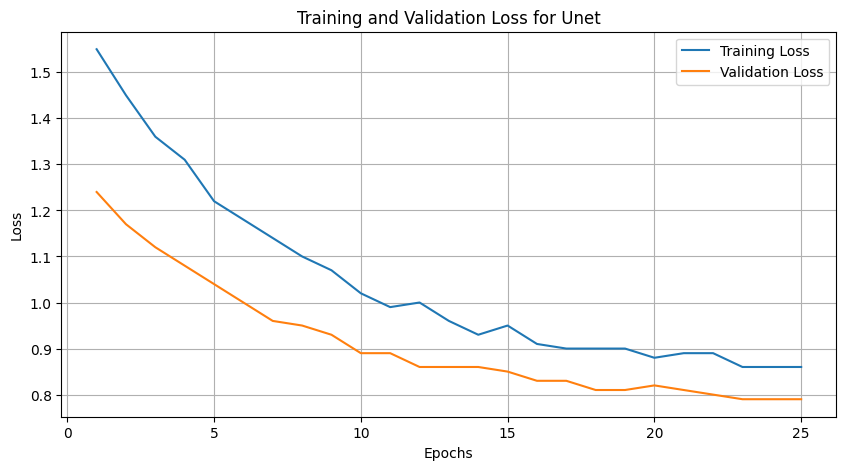

In [16]:
# Plot the losses
plt.figure(figsize=(10, 5))
plt.plot(range(1, NUM_EPOCHS + 1), train_losses, label='Training Loss')
plt.plot(range(1, NUM_EPOCHS + 1), val_losses, label='Validation Loss')
plt.title('Training and Validation Loss for Unet')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

### Prediction Visualisation

Display several images, their masks, and the predicted mask by your model.

In [ ]:
def load_model_from_checkpoint(model, model_weights_path):
  try:
      print(f"Loading model weights from: {model_weights_path}")
      model.load_state_dict(torch.load(model_weights_path, map_location=device))
      print("Model weights loaded successfully!")

  except FileNotFoundError:
      print(f"Error: The file was not found at {model_weights_path}")
      print("Please make sure the file path is correct and the file is in the right directory.")
  except Exception as e:
      print(f"An error occurred while loading the model: {e}")
      print("Ensure the model architecture in your script matches the one in the saved file exactly.")


  model.eval()

  return model

In [ ]:
inference_model = ResidualAttentionUNet().to(device)
inference_model = load_model_from_checkpoint(inference_model, "/content/drive/MyDrive/AI-Project-Checkpoints/best_residual_attention_unet.pth")

Loading model weights from: /content/drive/MyDrive/AI-Project-Checkpoints/best_residual_attention_unet.pth
Model weights loaded successfully!


In [ ]:
def predict_mask(model, image=None, image_path=None, image_size=(256, 256), threshold=0.6, device='cuda'):
    image_transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
    ])

    if image_path != None:
      image = cv2.imread(image_path)
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      image = cv2.resize(image, image_size)
      image = Image.fromarray(image)

    input_tensor = image_transform(image)

    input_tensor = input_tensor.unsqueeze(0).to(device)

    model.eval()
    with torch.no_grad():
        raw_prediction = model(input_tensor)

    prediction = raw_prediction.squeeze().cpu().numpy()

    binary_mask = (prediction > threshold).astype(np.uint8)

    return binary_mask

In [ ]:
test_predictions = []

for image in test_images:
  test_predictions.append(predict_mask(inference_model, image))

In [ ]:
def visualize_image_mask_prediction(images, masks, predictions, n=10):
    plt.figure(figsize=(15, 5 * n))

    # images = images * 0.5 + 0.5

    for i in range(n):
        img = images[i]
        mask = masks[i]
        pred = predictions[i]

        pred_binary = (pred > 0.5).astype(float)

        # --- Plot Original Image ---
        plt.subplot(n, 3, 3 * i + 1)
        plt.imshow(img)
        plt.title(f"Image {i+1}")
        plt.axis('off')

        # --- Plot Ground Truth Mask ---
        plt.subplot(n, 3, 3 * i + 2)
        plt.imshow(mask, cmap='gray')
        plt.title(f"Ground Truth Mask {i+1}")
        plt.axis('off')

        # --- Plot Predicted Mask ---
        plt.subplot(n, 3, 3 * i + 3)
        plt.imshow(pred_binary, cmap='gray')
        plt.title(f"Predicted Mask {i+1}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

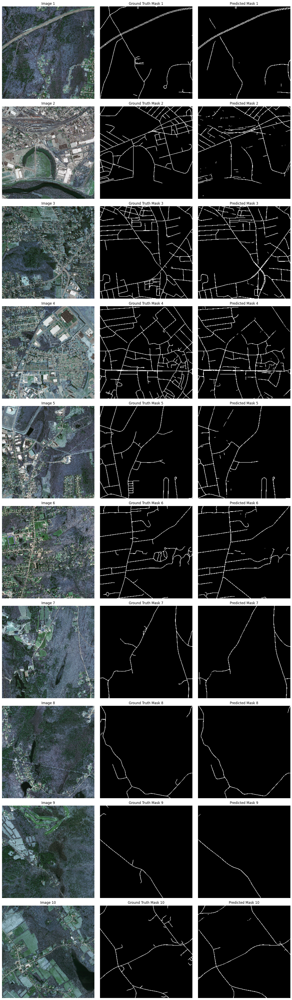

In [ ]:
visualize_image_mask_prediction(test_images, test_masks, test_predictions)